In [1]:
## %%# General
import warnings
warnings.filterwarnings ( "ignore" )
import os
from time import time
from datetime import datetime,timedelta  #time,
import matplotlib.pyplot as plt
import multiprocess as mp
from IPython.display import display
import multiprocess as mp

# Scientific and data
import json
import yaml
import numpy as np
from tqdm import tqdm
import pandas as pd
import  xarray as xr
from scipy.ndimage import gaussian_filter1d, gaussian_filter
from scipy.interpolate import griddata
from functools import partial
import seaborn as sns
eps = np.finfo(np.float).eps
import calendar
import matplotlib.dates as mdates

# pytorch
import torch , torchvision
import torch.utils.data
import torch.nn as nn
from torch import functional as F
from torch import Tensor
torch.manual_seed(8318)


# Local modules
import  global_settings as gs
import data_loader as dl
import preprocessing as prep
from utils import create_and_configer_logger
from miscLidar import calc_tau,calc_extiction_klett, calc_gauss_curve,generate_poisson_signal, generate_poisson_signal_STEP

In [2]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
#sns.set_context('notebook')
#sns.set(rc={"figure.dpi":300, 'savefig.dpi':300})
timeformat = mdates.DateFormatter('%H:%M')
wavelengts = [355,532,1064]
colors = ["darkblue", "darkgreen","darkred"]


In [3]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
#sns.set_context('notebook')
#sns.set(rc={"figure.dpi":300, 'savefig.dpi':300})
timeformat = mdates.DateFormatter('%H:%M')
wavelengts = [355,532,1064]
colors = ["darkblue", "darkgreen","darkred"]

In [4]:
def poiss_wav (p_wavelength):
	from tqdm import tqdm
	import xarray as xr
	import miscLidar as mscLid
	pn_t =[]
	wavelength = int((p_wavelength.Wavelength).values)
	for t in tqdm(p_wavelength.Time,desc = f'Time loop {wavelength}|'):
		pn_t.append(xr.apply_ufunc(lambda x: mscLid.generate_poisson_signal_STEP(x,p_wavelength.Height.size),
		                           p_wavelength.sel(Time = t),
		                           keep_attrs =True,dask = 'parallelized'))
	return pn_t

## Load extended calibration database

In [5]:
station_name = 'haifa'
station = gs.Station ( stations_csv_path = 'stations.csv' , station_name = station_name )
# print(station)
start_date = datetime ( 2017 , 9 , 1 )
end_date = datetime ( 2017 , 10 , 31 )
ds_path_extended = f"dataset_{station_name}_{start_date.strftime ( '%Y-%m-%d' )}_{end_date.strftime ( '%Y-%m-%d' )}_extended.nc"
csv_path_extended = f"dataset_{station_name}_{start_date.strftime ( '%Y-%m-%d' )}_{end_date.strftime ( '%Y-%m-%d' )}_extended.csv"
df = pd.read_csv ( csv_path_extended )
ds_extended = prep.load_dataset ( ds_path_extended)
wavelengths = [355,532,1064]
#display(ds_extended)

#### Choose a day

In [6]:
df_times = ds_extended.Time.to_pandas()
time_00 = datetime.today().time().min
days = [datetime.combine(day,time_00) for day in sorted(df_times.groupby(df_times.dt.date).groups.keys())]
day_number =2
day = days[day_number]
day_str = day.strftime('%Y-%m-%d')
# %%
cur_day = datetime.strptime(day_str,'%Y-%m-%d')
min_t = datetime.combine(cur_day.date(), cur_day.time().min)
max_t = cur_day + timedelta(hours = 24) - timedelta(seconds = 30)
t_slice = slice(min_t,cur_day.date()+timedelta(days=1))
arr_day = []
time_indx = pd.date_range(start = min_t, end = max_t,freq = '30S')
# %%

#### Create calibration daily dataset

In [7]:
# %%
for wavelength in [355,532,1064]:
	ds_i = ds_extended.sel(Wavelength = wavelength,Time= t_slice)#.copy(deep = True)
	ds_i = ds_i.resample(Time='30S').interpolate('nearest')
	ds_i = ds_i.reindex({"Time" : time_indx}, method="nearest",fill_value =  0)
	arr_day.append(ds_i)
ds_day = xr.concat(arr_day,dim = 'Wavelength')

#ds_day
# %%

#### 1. Lidar reference heights of the day - as calibrated by TROPOS

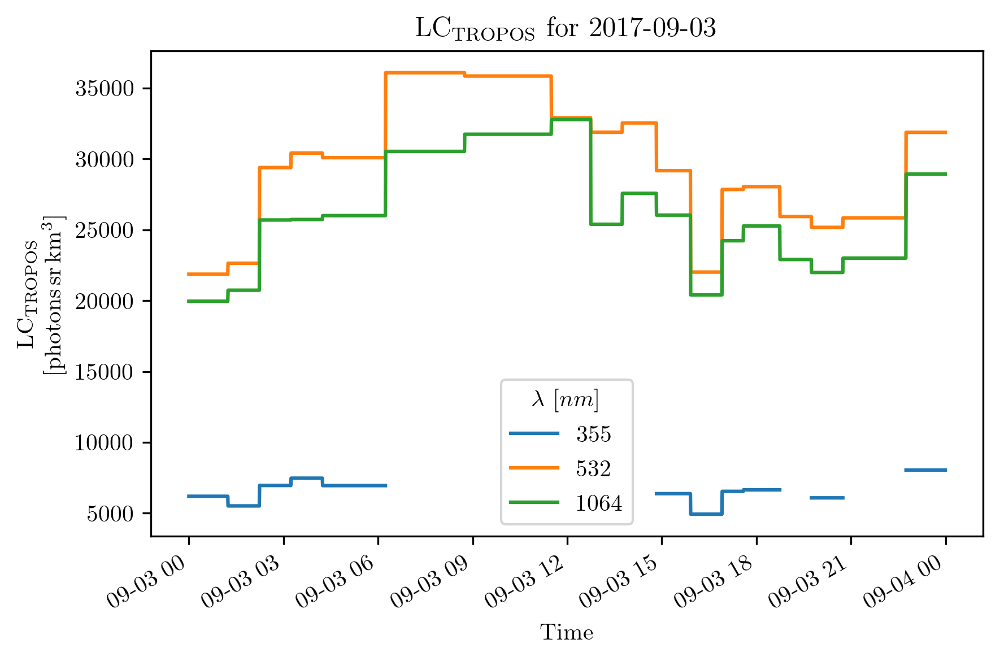

In [8]:
# %%
fig, ax = plt.subplots(nrows=1, ncols=1)
ds_day.LC.plot(x='Time',hue='Wavelength',ax=ax)
ax.set_title(fr"{ds_day.LC.long_name} for {day_str}")
plt.tight_layout()
plt.show()
# %%

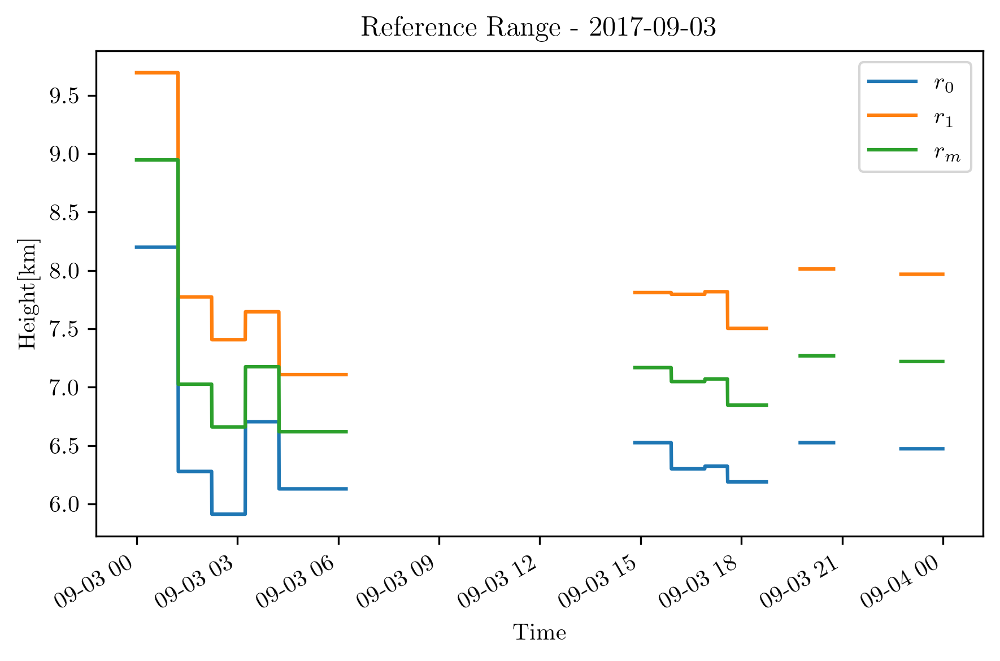

In [9]:
DISP_FIG = True
if DISP_FIG:
	fig, ax = plt.subplots(nrows=1, ncols=1)
	for r in ['r0','r1','rm']:
		ds_day[r].sel(Wavelength=355).plot(label=ds_day[r].long_name,ax=ax)
	ax.set_title(fr'Reference Range - {day_str}')
	ax.set_ylabel(r'$\rm Height[km]$')
	plt.legend()
	plt.tight_layout()
	plt.show()

## Load generated aerosol profiles

In [10]:
generation_folder =r'D:\data_haifa\GENERATION'
month_folder = start_date.strftime ( "%m" )
aer_folder = os.path.join(generation_folder,'aerosol_dataset',month_folder)
nc_aer = '2017_09_03_Haifa_aerosol.nc'
ds_aer = prep.load_dataset(os.path.join(aer_folder,nc_aer))

In [11]:
ds_aer

<xarray.Dataset>
Dimensions:             (Height: 3000, Time: 2880, Wavelength: 3)
Coordinates:
  * Height              (Height) float64 0.3088 0.3162 0.3237 ... 22.71 22.72
  * Time                (Time) datetime64[ns] 2017-09-03 ... 2017-09-03T23:59:30
  * Wavelength          (Wavelength) uint64 355 532 1064
Data variables:
    beta                (Wavelength, Height, Time) float64 0.002213 ... 0.0
    sigma               (Wavelength, Height, Time) float64 0.1328 0.1328 ... 0.0
    lambda_nm           (Wavelength) uint16 355 532 1064
    date                datetime64[ns] 2017-09-03
    max_sigm_g          float64 0.22
    ang_532_1064        float64 1.404
    ang_355_532         float64 1.25
    LR                  int32 60
    r_max               float64 12.5
    aeronet_source      <U52 'D:\\data_haifa\\AERONET\\20170901_20170930_haif...
    calibration_source  <U47 'dataset_haifa_2017-09-01_2017-10-31_extended.nc'
Attributes:
    info:         Daily generated aerosol profiles
    source_file:  generate_density.ipynb
    location:     haifa

In [12]:
sigma_aer =  xr.apply_ufunc(lambda x: x + 1E+3*eps*np.random.rand(3000,2880),ds_aer.sigma, keep_attrs = True)
beta_aer = xr.apply_ufunc(lambda x: x + 1E+1*eps*np.random.rand(3000,2880),ds_aer.sigma, keep_attrs = True)

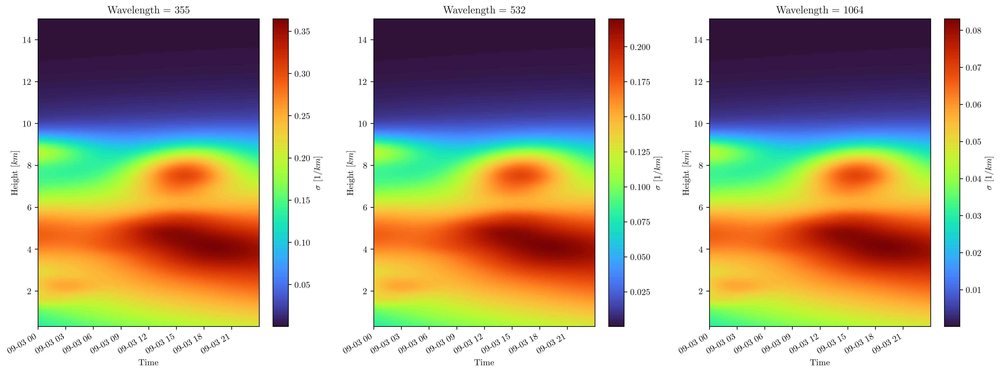

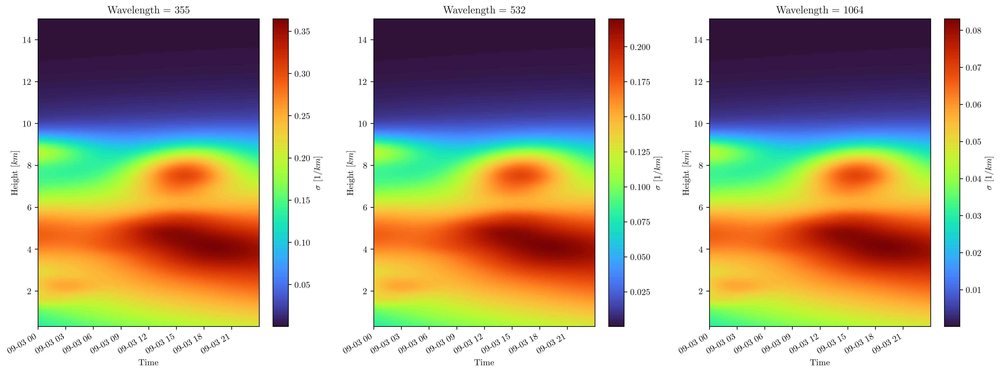

In [13]:
if DISP_FIG:
	height_slice=slice(0.0,15)
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,6))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		sigma_aer.sel(Height=height_slice, Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,6))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		beta_aer.sel(Height=height_slice, Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

In [14]:
## Load molecular profiles

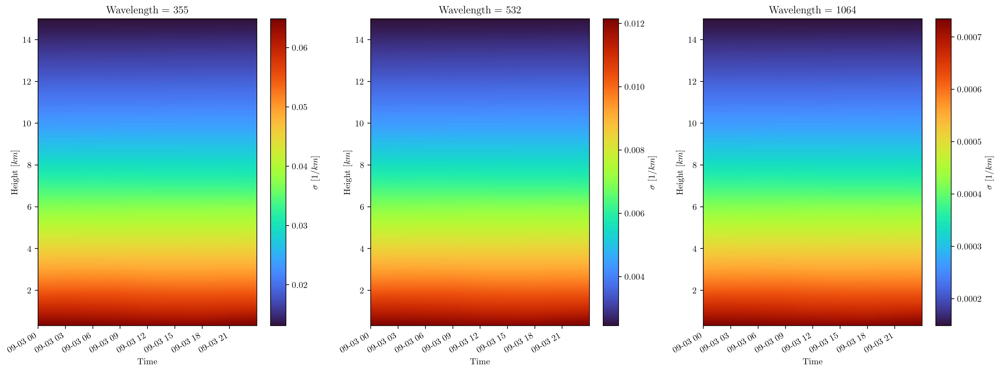

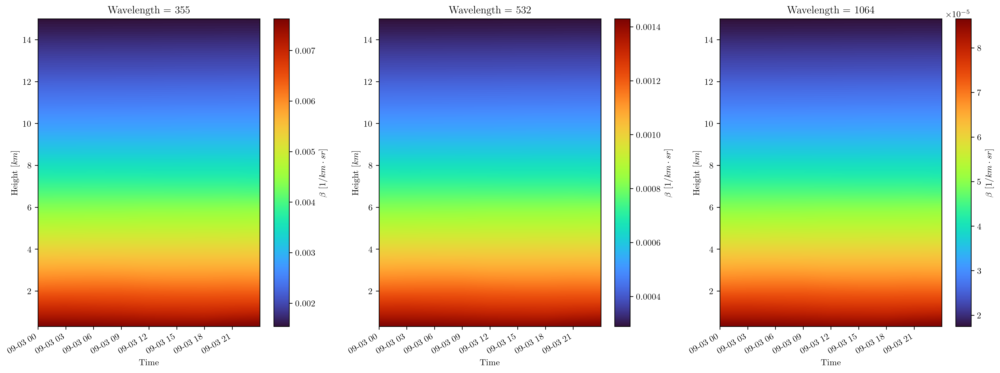

In [15]:
nc_name = r'2017_09_03_Haifa_molecular.nc'
folder_name = r'D:\data_haifa\DATA FROM TROPOS\molecular_dataset\2017\09'
ds_mol = prep.load_dataset(os.path.join(folder_name,nc_name))

if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,6))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		ds_mol.sigma.sel(Height=height_slice, Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,6))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		ds_mol.beta.sel(Height=height_slice, Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

## Summing aerosol and molecular profiles
### $\beta = \beta_{aer}+\beta_{mol}$
### $\sigma = \sigma_{aer}+\sigma_{mol}$
### The molecular profiles were calculated from radiosondes measurements from NOA
> TODO: Blend or "fade" the aerosol layer before adding to molecular density

In [16]:
ds_total = xr.zeros_like(ds_mol)
ds_total= ds_total.assign(date= ds_mol.date)
ds_total.attrs = {'info': 'Daily generated profiles',
                'sources_file': 'generate_density.ipynb',
                'location': station.name,
}
ds_aer.lambda_nm.loc[:]=[355,532,1064]

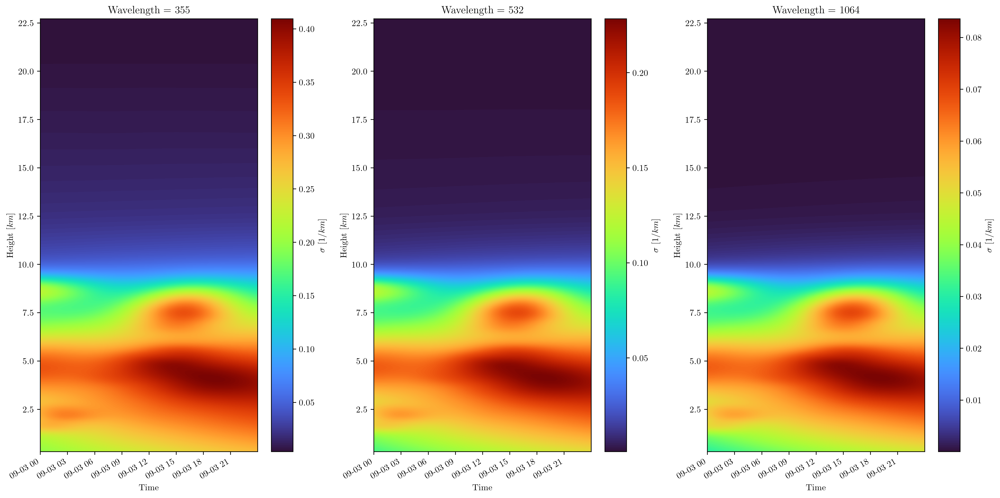

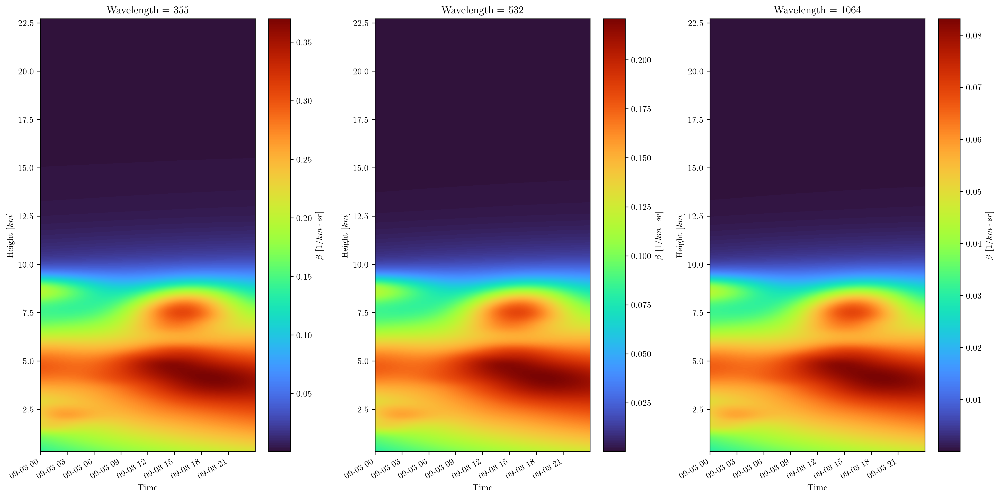

In [17]:
ds_total.sigma.loc[:] = ds_mol.sigma + sigma_aer
ds_total.beta.loc[:] = ds_mol.beta + beta_aer
if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		ds_total.sigma.sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		ds_total.beta.sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

## Calculating $\beta\exp(-2\tau)$

In [18]:

alt_km = station.altitude*1e-3
heights = ds_total.Height.values - alt_km
dr = heights[1]-heights[0]

exp_tau_c =[]
for wavelength in wavelengths:
	exp_tau_t =[]
	for t in tqdm(ds_total.Time):
		sigma_t = ds_total.sigma.sel(Time= t)
		e_tau = xr.apply_ufunc(lambda x: np.exp(-2*calc_tau(x,heights)),
		                       sigma_t.sel(Wavelength= wavelength),keep_attrs = True)
		e_tau.name = r'$\exp(-2 \tau)$'
		exp_tau_t.append(e_tau)

	exp_tau_c.append(xr.concat(exp_tau_t,dim = 'Time'))
exp_tau_d = xr.concat(exp_tau_c,dim = 'Wavelength')
exp_tau_d = exp_tau_d.transpose('Wavelength','Height','Time' )
ds_total.attbsc.loc[:] = exp_tau_d.loc[:]*ds_total.beta

for profile in ['beta','sigma','attbsc']:
    ds_total[profile].attrs['info'] = ds_total[profile].attrs['info'].replace('Molecular','Total')


100%|██████████| 2880/2880 [00:04<00:00, 717.22it/s]


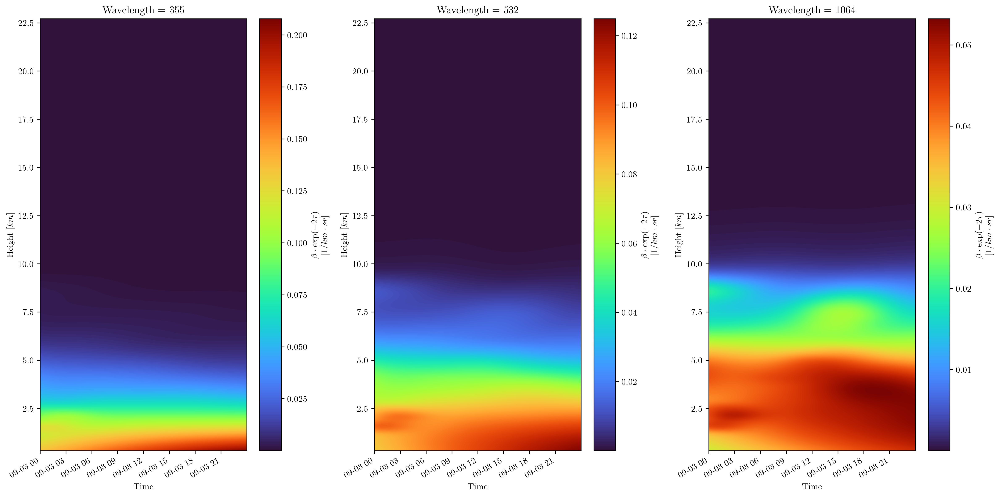

In [19]:
if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		ds_total.attbsc.sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

## Daily lidar constant

#### 1. Lidar power's factor of the day - as calibrated by TROPOS retrievals

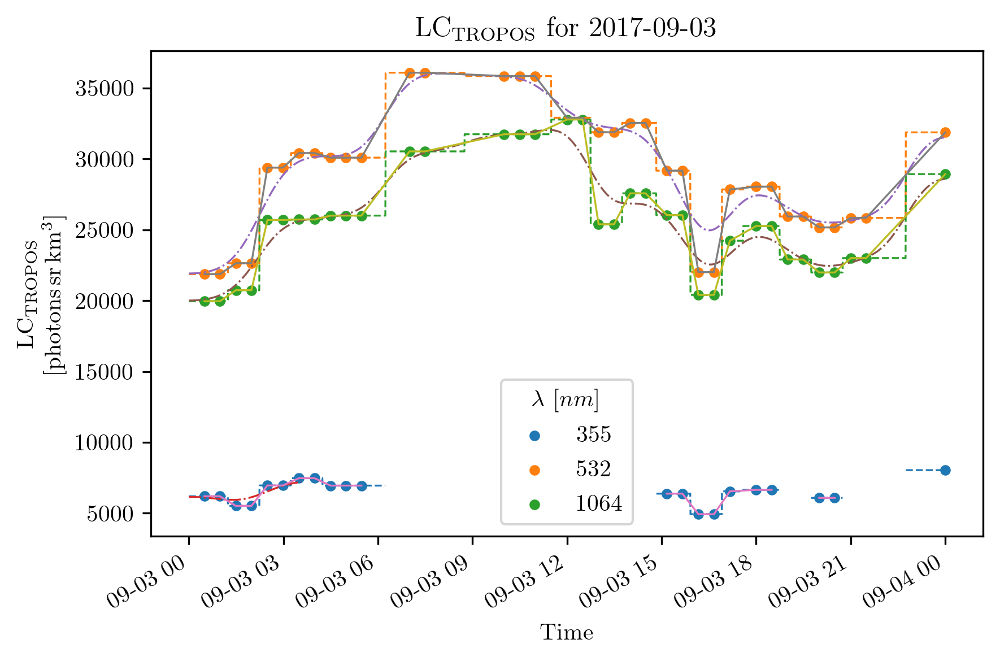

In [20]:
ds_smooth = ds_day.apply(func = gaussian_filter1d,sigma=80,keep_attrs =True)

fig, ax = plt.subplots(nrows=1, ncols=1)
ds_day.LC.plot(x='Time',hue='Wavelength',ax=ax,linewidth=0.8,linestyle='--')
ds_smooth.LC.plot(x='Time',hue='Wavelength',ax=ax,linewidth=0.8,linestyle='-.')
ds_extended.sel(Time=slice(cur_day,cur_day+timedelta(hours = 24))).LC.plot(hue='Wavelength',linewidth=0.8)
ds_extended.sel(Time=slice(cur_day,cur_day+timedelta(hours = 24))).\
	plot.scatter(y='LC',x='Time', hue='Wavelength',s=30,hue_style ='discrete',edgecolor='w')

ax.set_title(fr"{ds_day.LC.long_name} for {day_str}")
plt.tight_layout()
plt.show()

#### 2. Lidar power's factor of the day - generated

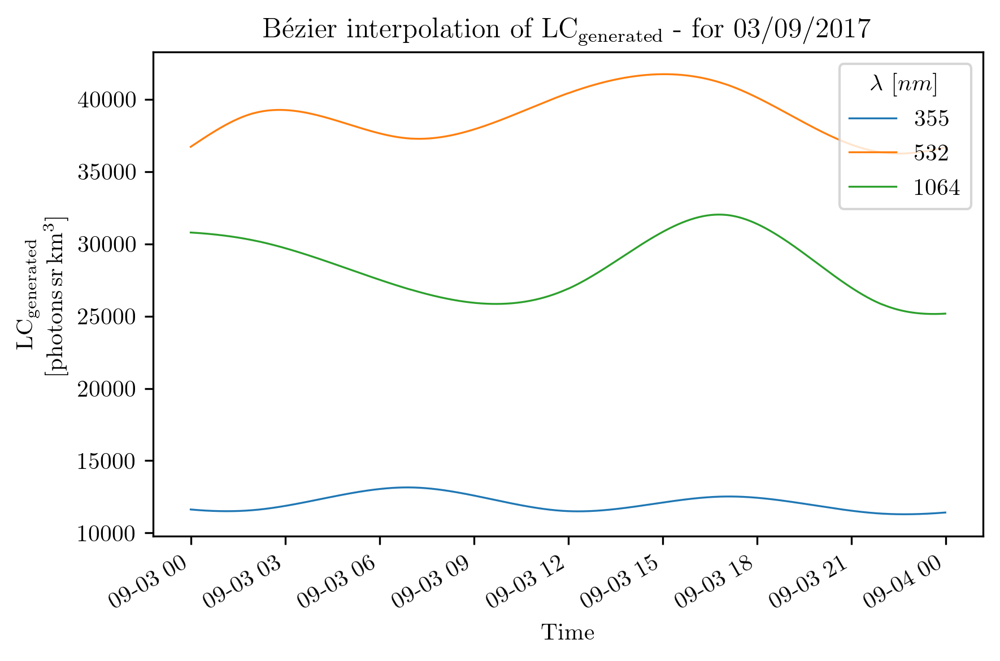

In [21]:
nc_power = f"generated_LC_{station.name}_{start_date.strftime('%Y-%m-%d')}_{end_date.strftime('%Y-%m-%d')}.nc"
ds_gen_p = prep.load_dataset(os.path.join(generation_folder,nc_power))
tday = slice(cur_day,cur_day+timedelta(hours = 24)-timedelta(seconds = 30))
p_day_gen = ds_gen_p.p.sel(Time=tday)
p_day_gen.plot(hue='Wavelength',linewidth=0.8)
#ds_gen_p.sel(Time=tday).plot.scatter(y='p_new',x='Time',hue='Wavelength',s=15,hue_style ='discrete',edgecolor='w')
plt.title(fr"B\'ezier interpolation of {ds_gen_p.p.long_name} - for {cur_day.strftime('%d/%m/%Y' )}")
plt.tight_layout()
plt.show()

#### 3. Calculating range corrected signal $p\cdot r^2 =LC_{generated}\cdot\beta\exp(-2\tau)$
- Calculate a new Lidar signal $p$,based on LC generated p_day_gen.
> see  generation process at: C:\Users\addalin\Dropbox\Lidar\code\generate_LC_pattern.ipynb

In [22]:
rr = heights**2
pr2_c =[]
for wavelength in wavelengths:
    pr2_t =[]
    p_t=[]
    for t in tqdm(ds_total.Time,desc = f'Time loop for {wavelength}'):
        attbsc_t = ds_total.attbsc.sel(Time= t)
        LC_t = p_day_gen.sel(Time = t) #   ds_smooth.LC.sel(Time = t)
        pr2 = xr.apply_ufunc(lambda x,y:(x*y)  ,
                            attbsc_t.sel(Wavelength= wavelength),
                            LC_t.sel(Wavelength= wavelength),keep_attrs = True)
        pr2.name = r'$pr2$'
        pr2_t.append(pr2)
        
    pr2_c.append(xr.concat(pr2_t,dim = 'Time'))
    
pr2_d = xr.concat(pr2_c,dim = 'Wavelength')
pr2_d = pr2_d.transpose('Wavelength','Height','Time' )
pr2_d.attrs['info']='Lidar Range Corrected Signal'
pr2_d.attrs['long_name']=r'$p$'+r'$\cdot r^2$'
pr2_d.attrs['units']=r'$\rm$'+r'$photons$'+r'$\cdot km^2$'



Time loop for 1064: 100%|██████████| 2880/2880 [00:08<00:00, 353.31it/s]


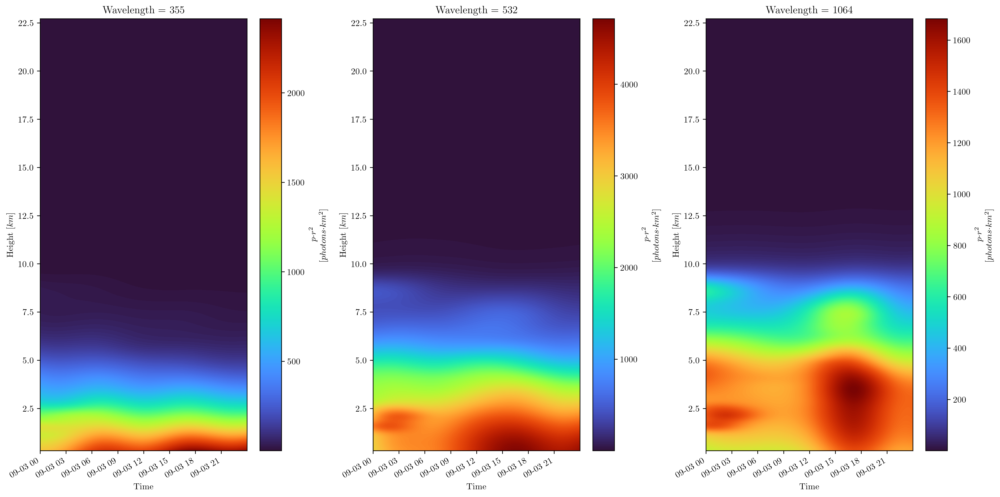

In [23]:
if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		pr2_d.sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

In [24]:
ds_total = ds_total.assign(rr= xr.Variable(dims=('Wavelength','Height'),data=np.tile(heights,(3,1))**2))
p_d= (pr2_d/ds_total.rr).astype(int)
p_d.attrs['info']='Lidar Signal'
p_d.attrs['long_name']=r'$p$'
p_d.attrs['units']=r'$photons$'
p_d.name=r'$p$'

#### 4. Calculating lidar signal $p = \frac{LC_{generated}}{r^2}\cdot\beta\exp(-2\tau)$

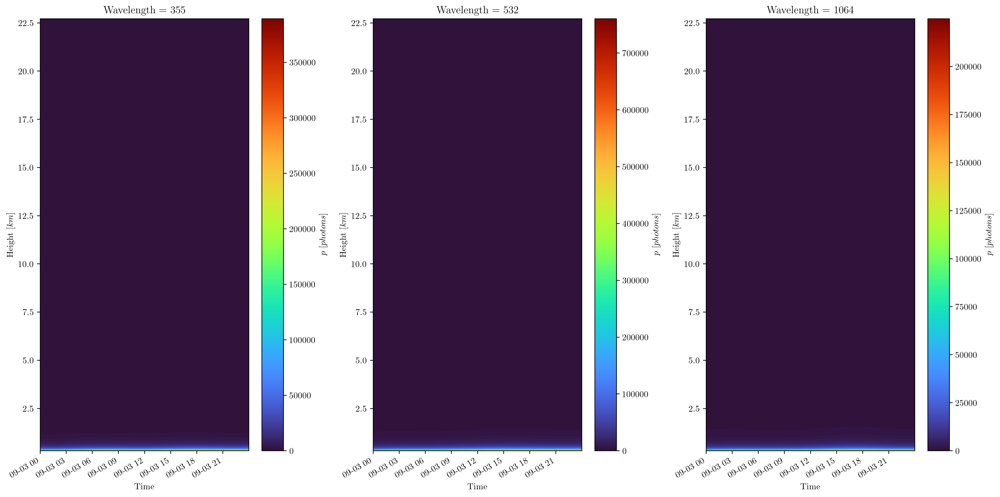

In [25]:
if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		p_d.sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

## Daily background
- Created daily mean background signal in: generate_bg_signals.ipynb

#### 1. Load bg mean signal per month

In [26]:
month = cur_day.month
year = cur_day.year
last = (calendar.monthrange(year,month)[1])
start_dt = datetime(year,month,1)
end_dt = datetime(year,month,last)

start_dt, end_dt
nc_name = f"generated_bg_{station.name}_{start_dt.strftime('%Y-%m-%d')}_{end_dt.strftime('%Y-%m-%d')}.nc"
bg_folder= r'D:\data_haifa\GENERATION\bg_dataset'
bg_ds =  prep.load_dataset(ncpath =os.path.join( bg_folder, nc_name))

#### 2. Slice the relevant day of the monthly signal

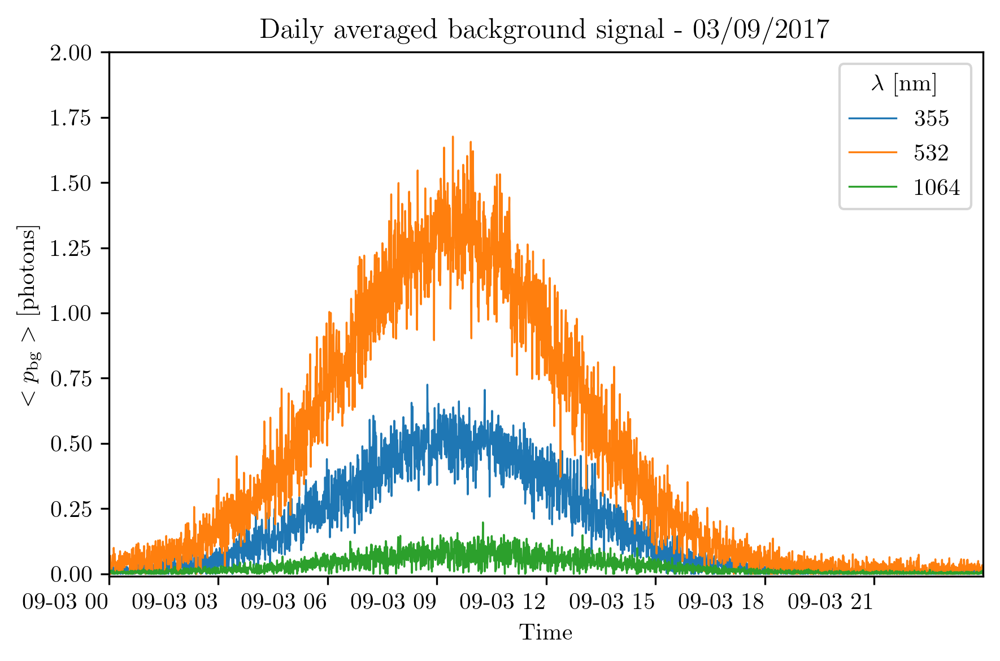

In [27]:
dslice = slice(cur_day,cur_day+timedelta(days = 1)-timedelta(seconds = 30))
ds_total = ds_total.assign( bgmean = bg_ds.sel(Time = dslice).bg)
if DISP_FIG:
	fig, ax = plt.subplots(ncols=1,nrows=1)
	ds_total.bgmean.sel(Time = dslice).plot(hue='Wavelength', ax=ax,linewidth=0.8)
	ax.set_xlim([dslice.start,dslice.stop])
	ax.set_title(f"{bg_ds.bg.info} - {cur_day.strftime('%d/%m/%Y')}")
	plt.xticks(rotation=0)
	ax.set_ybound([-.01,2])
	plt.tight_layout()
	plt.show()

#### 4. Calculate $P_{measure}$
- Calculate a new signal $p_{new} \sim Poiss (\mathbb{E} (p) ) $, $s.t.\;\mathbb{E} (p)  = p + <p_{bg}>$

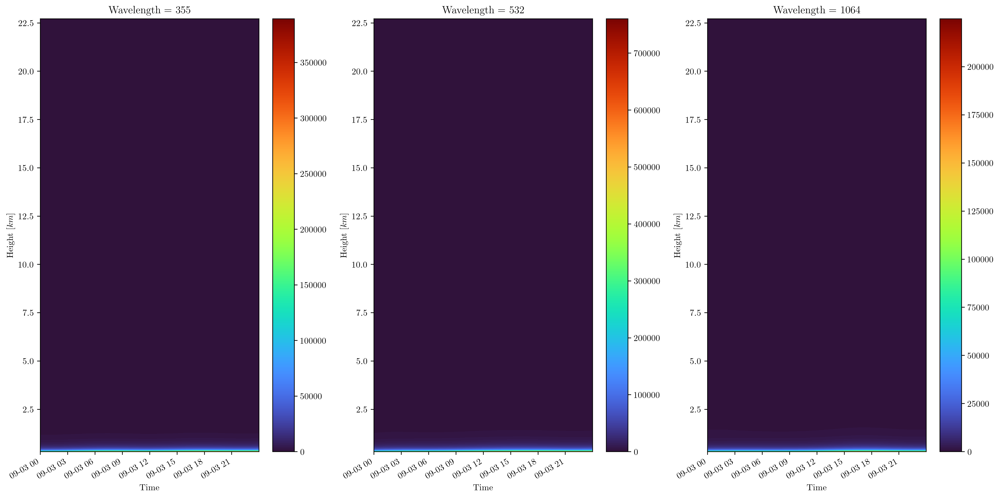

In [28]:
p_mean = p_d + ds_total.bgmean
p_std = xr.apply_ufunc(lambda x: np.sqrt(x),p_mean,keep_attrs =True)
if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		p_mean.sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

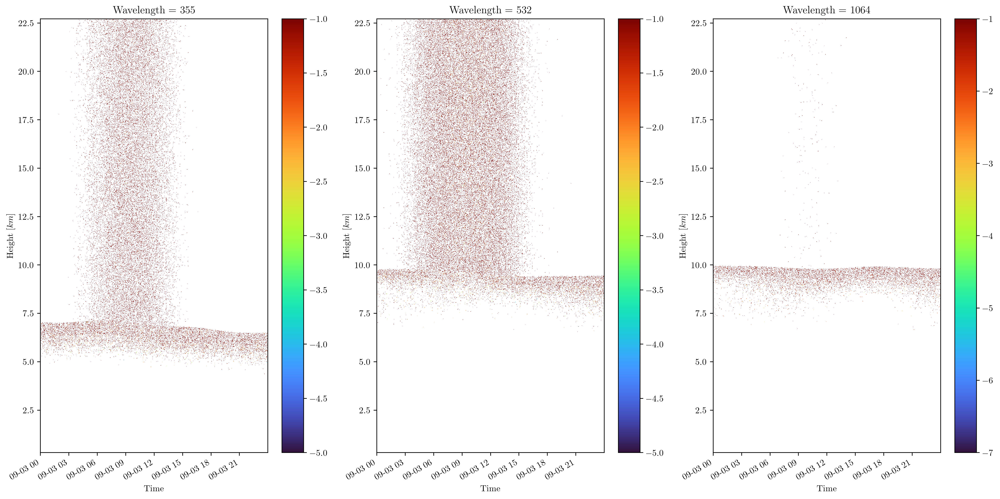

In [29]:
rand_P = p_std * np.random.normal(loc=0, scale=1.0, size=p_std.shape)
pn_d = (p_mean+rand_P).astype(int)

if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		pn_d.where(pn_d<0).sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

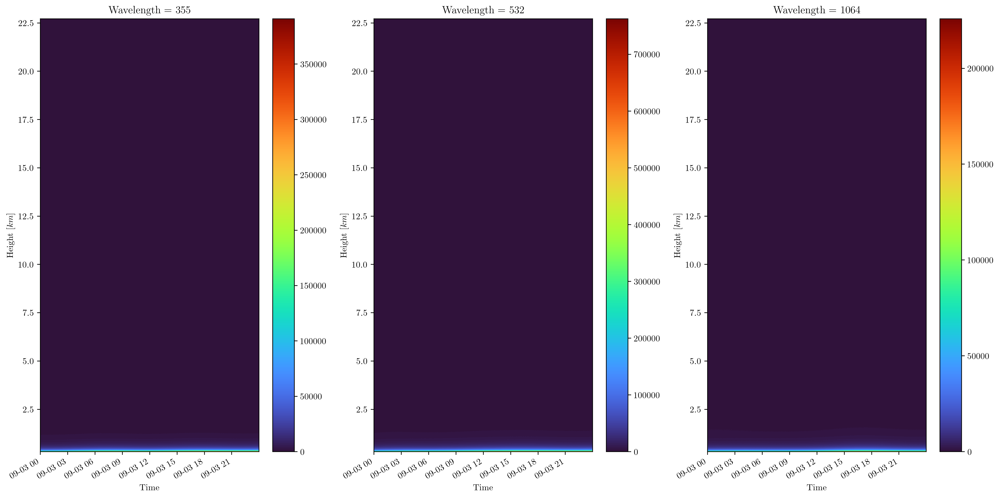

In [30]:
if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		pn_d.where(pn_d>=0).sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

In [31]:
pn_dp = pn_d.where(pn_d>=0.0)
pr2n_d= (pn_dp*ds_total.rr).astype(int)
pr2n_d.attrs['info']='Lidar Range Corrected Signal - noisy'
pr2n_d.attrs['long_name']=r'$p$'+r'$\cdot r^2$'
pr2n_d.attrs['units']=r'$\rm$'+r'$photons$'+r'$\cdot km^2$'


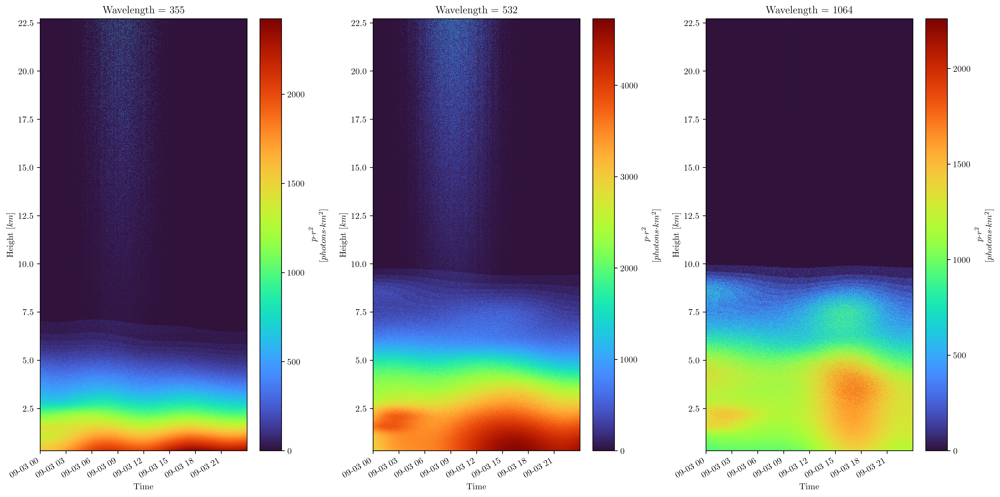

In [32]:
if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		pr2n_d.where(pr2n_d>=0.0).sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

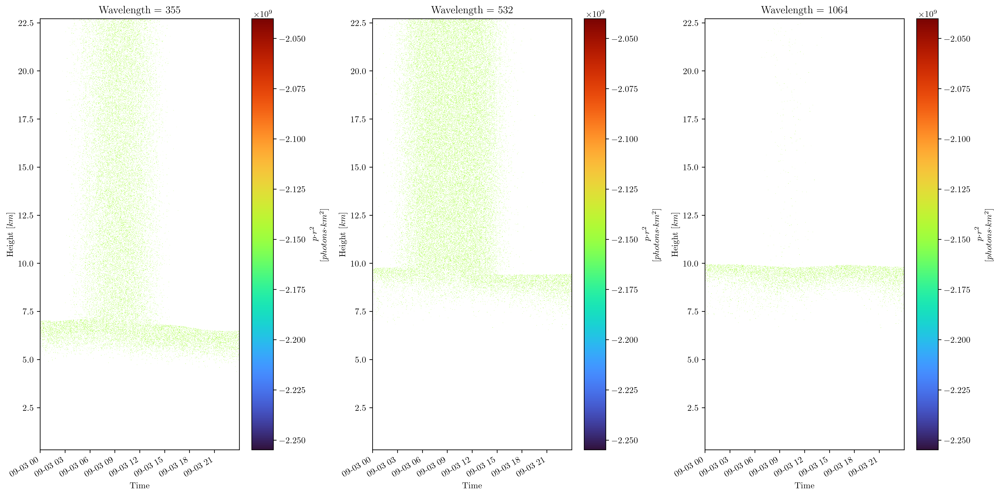

In [33]:
if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		pr2n_d.where(pr2n_d<0).sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()


In [34]:
pn =  xr.apply_ufunc(lambda x: generate_poisson_signal_STEP(x,p_mean.Height.size).astype(int),
p_mean.sel(Wavelength= wavelength,Time = p_mean.Time[0]),keep_attrs =True,dask = 'parallelized')


In [ ]:
pn_c =[]
pwavs = [p_mean.sel(Wavelength= wavelength) for wavelength in wavelengths]
with mp.Pool(3) as p :
	pn_t = p.map(poiss_wav ,pwavs)


In [ ]:
pn_c = [xr.concat(pn_t_i,dim = 'Time') for pn_t_i in pn_t]
pn_d = xr.concat(pn_c,dim = 'Wavelength')
pn_d = pn_d.transpose('Wavelength','Height','Time' )
pn_d.attrs['info']='Poisson Lidar Signal'
pn_d.attrs['long_name']=r'$p$'
pn_d.attrs['units']=r'$\rm$'+r'$photons$'

In [ ]:
pn_d.values.max()

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
for wavelength,ax in zip(wavelengths,axes.ravel()):
	pn_d.sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
plt.tight_layout()
plt.show()

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
for wavelength,max_v, ax in zip(wavelengths,[8,8,8],axes.ravel()):
	pn_d.where(pn_d>max_v).sel(Wavelength = wavelength,Height=slice(0.0,10.0)).plot(cmap='turbo',ax=ax)
plt.tight_layout()
plt.show()

In [ ]:
for wavelength,max_v,ax in zip(wavelengths,[15000,15000,15000],axes.ravel()):
	pn_d.where(pn_d<=max_v).sel(Wavelength = wavelength,
	                                                Height=slice(0.0,10.0)).plot(cmap='turbo')#,ax=ax)
	plt.tight_layout()
	plt.show()
#plt.tight_layout()
#plt.show()
#


In [ ]:
pr2n_d= (pn_d*ds_total.rr).astype(int)
pr2n_d.attrs['info']='Lidar Range Corrected Signal - noisy'
pr2n_d.attrs['long_name']=r'$p$'+r'$\cdot r^2$'
pr2n_d.attrs['units']=r'$\rm$'+r'$photons$'+r'$\cdot km^2$'
pr2n_d.values.max()

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
for wavelength,ax in zip(wavelengths,axes.ravel()):
	pr2n_d.sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
plt.tight_layout()
plt.show()

In [ ]:
#fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
for wavelength,max_v,ax in zip(wavelengths,[5000,5000,5000],axes.ravel()):
	pr2n_d.where(pr2n_d<=max_v).sel(Wavelength = wavelength).plot(cmap='turbo')#,ax=ax)
	plt.tight_layout()
	plt.show()
#plt.tight_layout()
#plt.show()

In [ ]:
#fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
for wavelength,max_v,ax in zip(wavelengths,[5000,5000,5000],axes.ravel()):
	pr2n_d.where(pr2n_d<=max_v).sel(Wavelength = wavelength,
	                                                Height=slice(0.0,15.0)).plot(cmap='turbo')#,ax=ax)
	plt.tight_layout()
	plt.show()
#plt.tight_layout()
#plt.show()
#